In [1]:
import numpy as np
import pandas as pd
import os
import datetime
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_log_error
import os

In [2]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

def truncateFloat(data):
    return tuple( ["{0:.2f}".format(x) if isinstance(x,float) else (x if not isinstance(x,tuple) else truncateFloat(x)) for x in data])

Load Files

In [3]:
IN_FP = '../input/store-sales-time-series-forecasting'
TRAIN_FP = os.path.join(IN_FP, 'train.csv')
TEST_FP = os.path.join(IN_FP, 'test.csv')
HOLIDAYS_FP = os.path.join(IN_FP, 'holidays_events.csv')

In [4]:
store_sales = pd.read_csv(
    TRAIN_FP,
    usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
        'onpromotion': 'uint32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)

store_sales['date'] = store_sales.date.dt.to_period('D')

m_index = pd.MultiIndex.from_product([store_sales["store_nbr"].unique(),
                                      store_sales["family"].unique(),
                                      pd.date_range(start="2013-1-1", end="2017-8-15", freq="D").to_period('D')] # to get missing Christmas Days
                                     ,names=["store_nbr","family", "date"])
store_sales = store_sales.set_index(["store_nbr","family", "date"]).reindex(m_index, fill_value=0).sort_index()

store_sales = store_sales.unstack(['store_nbr', 'family']).fillna(0) # there are lots!
store_sales = store_sales.stack(['store_nbr', 'family'])
store_sales = store_sales[['sales','onpromotion']]

test = pd.read_csv(
    TEST_FP,
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'onpromotion': 'uint32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)

test['date'] = test.date.dt.to_period('D')
test = test.set_index(['store_nbr', 'family', 'date']).sort_index()

holidays_events = pd.read_csv(
    HOLIDAYS_FP,
    dtype={
        'type': 'category',
        'locale': 'category',
        'locale_name': 'category',
        'description': 'category',
        'transferred': 'bool',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
holidays_events['date'] = holidays_events['date'].replace({'2013-04-29':pd.to_datetime('2013-03-29')})
holidays_events = holidays_events.set_index('date').to_period('D')

Create Calender

In [5]:
# Creating workday calender using holidays
# https://www.kaggle.com/dkomyagin/simple-ts-ridge-rf

calender = pd.DataFrame(index=pd.date_range('2013-01-01', '2017-08-31')).to_period('D')
calender['dofw'] = calender.index.dayofweek

df_hev = holidays_events[holidays_events.locale == 'National']  # Only considering national holidays in this instance
df_hev = df_hev.groupby(df_hev.index).first()

calender['wd'] = True
calender.loc[calender.dofw > 4, 'wd'] = False  # Omit weekends

calender = calender.merge(df_hev, how='left', left_index=True, right_index=True)

calender.loc[calender.type == 'Bridge', 'wd'] = False
calender.loc[calender.type == 'Work Day', 'wd'] = True
calender.loc[calender.type == 'Transfer', 'wd'] = False
calender.loc[(calender.type == 'Holiday') & (calender.transferred == False), 'wd'] = False
calender.loc[(calender.type == 'Holiday') & (calender.transferred == True), 'wd'] = True

## Problem definition

In [6]:
print("Training Data\n", store_sales, "\n\n")
print("Test Data\n", test)

Training Data
                                                        sales  onpromotion
date       store_nbr family                                              
2013-01-01 1         AUTOMOTIVE                     0.000000            0
                     BABY CARE                      0.000000            0
                     BEAUTY                         0.000000            0
                     BEVERAGES                      0.000000            0
                     BOOKS                          0.000000            0
...                                                      ...          ...
2017-08-15 9         POULTRY                      438.132996            0
                     PREPARED FOODS               154.552994            1
                     PRODUCE                     2419.729004          148
                     SCHOOL AND OFFICE SUPPLIES   121.000000            8
                     SEAFOOD                       16.000000            0

[3008016 rows x 2 colu

## Forecast Requirements and Considerations
- 16 day forecast with 1 step lead time from 16th August 2017 to 31st August 2017
- Large parts of information missing prior to June 2015 so removed from training set
- Validation using the last 16 days of the training set

In [7]:
train_start_day = datetime.datetime(2015, 6, 16)
# train_start_day = datetime.datetime(2017, 5, 1)
train_end_day = datetime.datetime(2017, 7, 30)
full_train_end_day = datetime.datetime(2017, 8, 15)

val_start_day = datetime.datetime(2017, 7, 31)
val_end_day = full_train_end_day

test_start_day = datetime.datetime(2017, 8, 16)
test_end_day = datetime.datetime(2017, 8, 31)

### On-Promotion Leads

In [8]:
test_promo = test.unstack(['store_nbr','family']).loc(axis=1)['onpromotion']
promo = store_sales.unstack(['store_nbr', 'family']).loc(axis=1)['onpromotion']
promo = promo.append(test_promo)
promo.tail()

store_nbr           1                                                \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-08-27          0         0      1        23     0            5   
2017-08-28          0         0      1        31     0            1   
2017-08-29          0         0      1        31     0            5   
2017-08-30          0         0      0        35     0            7   
2017-08-31          0         0      1        33     0            4   

store_nbr                                   ...         9                      \
family     CELEBRATION CLEANING DAIRY DELI  ... MAGAZINES MEATS PERSONAL CARE   
date                                        ...                                 
2017-08-27           0        7     7    6  ...         0     0            14   
2017-08-28           0       11    12   10  ...         0     0            11   
2017-08-29           0       13    13    7  ...         0     0            12   
2017-08-30           0       11    16    5  ...         0     0            12   
2017-08-31           0       12    11    5  ...         0    20            14   

store_nbr                                                               \
family     PET SUPPLIES PLAYERS AND ELECTRONICS POULTRY PREPARED FOODS   
date                                                                     
2017-08-27            0                       0       0              0   
2017-08-28            0                       0       0              0   
2017-08-29            0                       0       0              0   
2017-08-30            0                       0       0              0   
2017-08-31            0                       0       1              0   

store_nbr                                              
family     PRODUCE SCHOOL AND OFFICE SUPPLIES SEAFOOD  
date                                                   
2017-08-27       2                          9       0  
2017-08-28       1                          9       0  
2017-08-29     141                          7       0  
2017-08-30       1                          7       0  
2017-08-31       1                          9       0  

[5 rows x 1782 columns]

In [9]:
def make_leads(ts, leads, name='y'):
    return pd.concat(
        {f'{name}_lead_{i}': ts.shift(-i)
         for i in reversed(range(leads))},
        axis=1)

In [10]:
promo_leads = make_leads(promo, 3, name='promo')
promo_leads = promo_leads.drop(['promo_lead_0'], axis=1)
promo_leads_filled = promo_leads.fillna(method='ffill', axis=0)

In [11]:
train_promo_leads = promo_leads_filled.loc[:test_start_day]
test_promo_leads = promo_leads_filled.loc[test_start_day:]

In [12]:
train_promo_leads_stacked = train_promo_leads.stack(['store_nbr', 'family'])
store_sales_promo_leads = store_sales.merge(train_promo_leads_stacked, on=['date','store_nbr', 'family'], how='left')

In [13]:
# CATEGORY = 'BEVERAGES'
# STORE_NUMBER = '1' # 1-54
# LEAD_NAME = 'promo_lead_2'

# unstacked_store_sales_with_promo_leads = store_sales_promo_leads.unstack(['store_nbr', 'family'])
# # x = unstacked_store_sales_with_promo_leads['sales'].loc(axis=1)[STORE_NUMBER].loc(axis=1)[CATEGORY]
# y1 = unstacked_store_sales_with_promo_leads[LEAD_NAME].loc(axis=1)[STORE_NUMBER].loc(axis=1)[CATEGORY]
# y2 = unstacked_store_sales_with_promo_leads['onpromotion'].loc(axis=1)[STORE_NUMBER].loc(axis=1)[CATEGORY]

# fig, ax = plt.subplots(figsize=(16,6))
# y1.plot(ax=ax)
# y2.plot(ax=ax)
# # sns.regplot(x=x, y=y, ax=ax)
# # ax.set_ylabel(LEAD_NAME)
# # ax.set_xlabel('sales')
# # ax.set_title(f'STORE {STORE_NUMBER}, {CATEGORY}')

In [14]:
test_promo_leads_stacked = test_promo_leads.stack(['store_nbr', 'family'])
test_data_with_promo_leads = test.merge(test_promo_leads_stacked, on=['store_nbr', 'family', 'date'], how='left')
test_data_with_promo_leads.tail()

id  onpromotion  promo_lead_1  promo_lead_2
store_nbr family  date                                                        
9         SEAFOOD 2017-08-27  3022271            0           0.0           0.0
                  2017-08-28  3024053            0           0.0           0.0
                  2017-08-29  3025835            0           0.0           0.0
                  2017-08-30  3027617            0           0.0           0.0
                  2017-08-31  3029399            0           0.0           0.0

## Boosted Hybrid Class

In [15]:
class BoostedHybrid:
    def __init__(self, model1, model2):
        self.model1 = model1
        self.model2 = model2
        self.y_columns = None
        self.stack_cols = None
        self.y_resid = None
    
    def fit1(self, X1, y, stack_cols=None):
        self.model1.fit(X1, y)
        
        y_fit = pd.DataFrame(
            self.model1.predict(X1),
            index=X1.index,
            columns=y.columns        
        )
        
        self.y_resid = y - y_fit
        self.y_resid = self.y_resid.stack(stack_cols).squeeze()
        self.y_columns = y.columns

    def fit2(self, X2, ignore_first_n_rows, stack_cols=None):
        self.model2.fit(X2.iloc[ignore_first_n_rows*1782:, :], self.y_resid.iloc[ignore_first_n_rows*1782:])
        self.stack_cols = stack_cols
    
    def predict(self, X1, X2, ignore_first_n_rows):
        y_pred = pd.DataFrame(
            self.model1.predict(X1.iloc[ignore_first_n_rows:, :]),
            index=X1.iloc[ignore_first_n_rows:, :].index,
            columns=self.y_columns
        )
        
        y_pred = y_pred.stack(self.stack_cols).squeeze()
        y_pred += self.model2.predict(X2.iloc[ignore_first_n_rows*1782:, :])
        
        return y_pred.unstack(self.stack_cols)
        
        

## X1 Preparation
Creation of features for trend and seasonality

In [16]:
def create_X1_dp_features(df):
    y = df.loc[:, 'sales']
    fourier = CalendarFourier(freq='M', order=4)
    
    dp = DeterministicProcess(
        index=y.index,
        constant=True,
        order=1,
        seasonal=True,
        additional_terms=[fourier],
        drop=True    
    )
    
    return y, dp

def create_X1_day_features(X1, start_date, end_date, test=True):
    if test:
        X1 = X1.rename_axis('date')
    X1['NewYear'] = (X1.index.dayofyear == 1)
    X1['Christmas'] = (X1.index=='2016-12-25') | (X1.index=='2015-12-25') | (X1.index=='2014-12-25') | (X1.index=='2013-12-25')
    X1['wd'] = calender.loc[start_date:end_date]['wd'].values
    X1['type'] = calender.loc[start_date:end_date]['type'].values
    X1 = pd.get_dummies(X1, columns=['type'], drop_first=False)
    
    return X1

def create_X1(df, start_date, end_date, test=False):
    y, dp = create_X1_dp_features(df)
    X1 = dp.in_sample()
    X1 = create_X1_day_features(X1, start_date, end_date, test)
    
    return X1, y, dp

## X2 Preparation
Creation of features for categorical relationship identification

In [17]:
def encode_categoricals(df, columns):
    le = LabelEncoder()
    for col in columns:
        df[col] = le.fit_transform(df[col])
    return df

def create_X2_lags(ts, lags, lead_time=1, name='y', stack_cols=None):
    ts = ts.unstack(stack_cols)
    df = pd.concat(
        {
            f'{name}_lag_{i}': ts.shift(i, freq="D")
            for i in range(lead_time, lags + lead_time)
        },
    axis=1)
    df = df.stack(stack_cols).reset_index()
    df = encode_categoricals(df, stack_cols)
    df = df.set_index('date').sort_values(by=stack_cols)
    
    return df

def create_X2_promo_features(df, X2):
    df['promo_mean_rolling_7'] = df['promo_lag_1'].rolling(window=7, center=False).mean()
    df['promo_median_rolling_91'] = df['promo_lag_1'].rolling(window=91, center=False).median().fillna(method='bfill')
    return X2.merge(df, on=['date', 'store_nbr', 'family'], how='left')

def create_X2_lag_features(df, X2):
    df['y_mean_rolling_7'] = df['y_res_lag_1'].rolling(window=7, center=False).mean()
    df['y_median_rolling_91'] = df['y_res_lag_1'].rolling(window=91, center=False).median().fillna(method='bfill')
    return X2.merge(df, on=['date', 'store_nbr', 'family'], how='left')

def create_X2_other_features(df):
    df['wage_day'] = (df.index.day == df.index.daysinmonth) | (df.index.day == 15)
    df['wage_day_lag_1'] = (df.index.day == 1) | (df.index.day == 16)
    return df

def create_X2(df, y_resid):
    stack_columns = ['store_nbr', 'family']
    shifted_promo_df = create_X2_lags(df['onpromotion'].squeeze(), lags=2, name='promo', stack_cols=stack_columns)    
    shifted_y_df = create_X2_lags(y_resid, lags=2, name='y_res', stack_cols=stack_columns)
    
    df = df.reset_index(stack_columns)
    X2 = encode_categoricals(df, stack_columns)
    X2 = create_X2_other_features(X2)
    X2 = create_X2_promo_features(shifted_promo_df, X2)
    X2 = create_X2_lag_features(shifted_y_df, X2)
    
    return X2
    

## DirRec Forecast

In [18]:
training_days = (train_end_day - train_start_day).days + 1
validation_days = (val_end_day - val_start_day).days + 1
print(f'Training set of {training_days} days')
print(f'Validation set of {validation_days} days')

# store_sales_promo_leads

store_sales_in_date_range = store_sales_promo_leads.unstack(['store_nbr', 'family']).loc[train_start_day:train_end_day]
store_data_in_val_range = store_sales_promo_leads.unstack(['store_nbr', 'family']).loc[val_start_day:val_end_day]
y_val, _ = create_X1_dp_features(store_data_in_val_range)

Training set of 776 days
Validation set of 16 days


In [19]:
model1 = LinearRegression()
model2 = XGBRegressor()
max_lag = 7

val_model = BoostedHybrid(model1=model1, model2=model2)

X1_train, y_train, dp_val = create_X1(store_sales_in_date_range, train_start_day, train_end_day)
val_model.fit1(X1_train, y_train, stack_cols=['store_nbr', 'family'])

X2_train = create_X2(store_sales_in_date_range.drop('sales', axis=1).stack(['store_nbr', 'family']), val_model.y_resid)
val_model.fit2(X2_train, max_lag, stack_cols=['store_nbr', 'family'])

y_fit = val_model.predict(X1_train, X2_train, max_lag).clip(0.0)

<AxesSubplot:xlabel='date'>

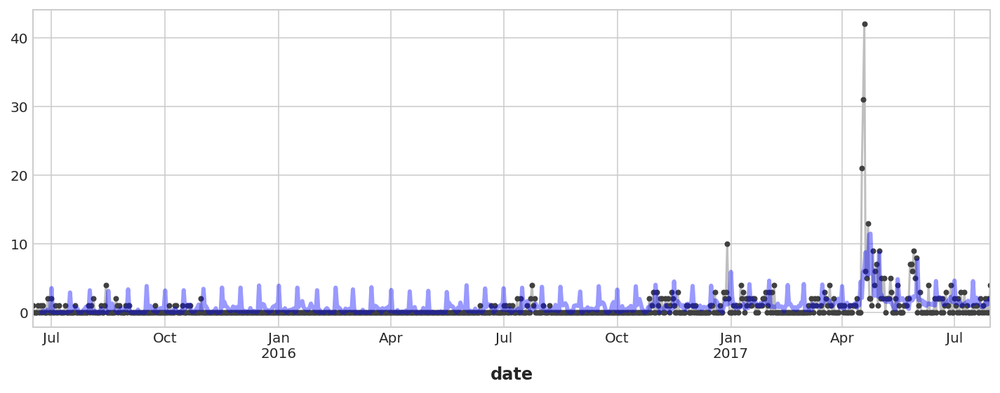

In [20]:
STORE = '25'
CATEGORY = 'SCHOOL AND OFFICE SUPPLIES'

fig, ax = plt.subplots(figsize=(10,4))
y_train.loc(axis=1)[STORE].loc(axis=1)[CATEGORY].plot(**plot_params, ax=ax)
y_fit.loc(axis=1)[STORE].loc(axis=1)[CATEGORY].plot(color='blue', linewidth=3, alpha=0.4, ax=ax)

In [21]:
dp_X1_val_date_range = dp_val.out_of_sample(steps=validation_days)

for step in range(validation_days):
    dp_steps_so_far = dp_X1_val_date_range.loc[val_start_day:val_start_day+pd.Timedelta(days=step),:]
    
    X1_combined_dp = pd.concat([dp_val.in_sample(), dp_steps_so_far])
    X2_combined = pd.concat([store_sales_in_date_range, store_data_in_val_range.loc[val_start_day:val_start_day+pd.Timedelta(days=step), :]])
    
    X1_val = create_X1_day_features(X1_combined_dp, train_start_day, val_start_day+pd.Timedelta(days=step))
    X2_val = create_X2(X2_combined.drop('sales', axis=1).stack(['store_nbr', 'family']),
                      val_model.y_resid)
    
    y_pred_combined = val_model.predict(X1_val, X2_val, max_lag).clip(0.0)
    y_plus_y_val = pd.concat([y_train, y_pred_combined.iloc[-(step+1):]])
    
    val_model.fit1(X1_val, y_plus_y_val, stack_cols=['store_nbr', 'family'])
    val_model.fit2(X2_val, max_lag, stack_cols=['store_nbr', 'family'])
    
    rmsle_valid = mean_squared_log_error(y_val.iloc[step:step+1], y_pred_combined.iloc[-1:]) ** 0.5
    print(val_start_day+pd.Timedelta(days=step), f' RMSLE validation: {rmsle_valid:.5f}')
    
y_pred = y_pred_combined[val_start_day:val_end_day]

2017-07-31 00:00:00  RMSLE validation: 0.45677
2017-08-01 00:00:00  RMSLE validation: 0.58930
2017-08-02 00:00:00  RMSLE validation: 0.53005
2017-08-03 00:00:00  RMSLE validation: 0.51699
2017-08-04 00:00:00  RMSLE validation: 0.51195
2017-08-05 00:00:00  RMSLE validation: 0.45272
2017-08-06 00:00:00  RMSLE validation: 0.49109
2017-08-07 00:00:00  RMSLE validation: 0.48726
2017-08-08 00:00:00  RMSLE validation: 0.50281
2017-08-09 00:00:00  RMSLE validation: 0.48971
2017-08-10 00:00:00  RMSLE validation: 0.59765
2017-08-11 00:00:00  RMSLE validation: 0.53990
2017-08-12 00:00:00  RMSLE validation: 0.55926
2017-08-13 00:00:00  RMSLE validation: 0.57205
2017-08-14 00:00:00  RMSLE validation: 0.53649
2017-08-15 00:00:00  RMSLE validation: 0.54653


In [22]:
# If not sold for the last 2 weeks predict zero

y_train_last_2_weeks = y_train.iloc(axis=0)[-14:]
zero_series = y_train_last_2_weeks.columns[(y_train_last_2_weeks == 0).all()]
print(zero_series)

y_pred_zero_corrected = y_pred.copy()

MultiIndex([( '1',                  'BABY CARE'),
            ( '1', 'SCHOOL AND OFFICE SUPPLIES'),
            ('10',                  'BABY CARE'),
            ('10',                      'BOOKS'),
            ('10',            'LAWN AND GARDEN'),
            ('10', 'SCHOOL AND OFFICE SUPPLIES'),
            ('11',                      'BOOKS'),
            ('12',                  'BABY CARE'),
            ('12',                      'BOOKS'),
            ('12',            'LAWN AND GARDEN'),
            ...
            ('54',                  'BABY CARE'),
            ('54',                      'BOOKS'),
            ('54',                 'LADIESWEAR'),
            ('54',            'LAWN AND GARDEN'),
            ('54', 'SCHOOL AND OFFICE SUPPLIES'),
            ( '6',                      'BOOKS'),
            ( '6', 'SCHOOL AND OFFICE SUPPLIES'),
            ( '8',            'HOME APPLIANCES'),
            ( '9',                      'BOOKS'),
            ( '9',            'HOM

In [23]:
y_pred_zero_corrected.loc(axis=1)[zero_series] = 0

In [24]:
y_pred_zero_corrected.head()

store_nbr           1                                                          \
family     AUTOMOTIVE BABY CARE    BEAUTY    BEVERAGES     BOOKS BREAD/BAKERY   
date                                                                            
2017-07-31   3.948659         0  2.805339  2440.766946  0.331394   405.339631   
2017-08-01   6.948126         0  5.999157  2444.931764  2.612273   393.750653   
2017-08-02   4.789433         0  3.158584  2683.988486  0.426909   464.476310   
2017-08-03   4.237445         0  3.600313  2272.182888  0.259907   397.950522   
2017-08-04   5.257135         0  3.484696  2559.917077  0.354418   432.612661   

store_nbr                                                   ...         9  \
family     CELEBRATION    CLEANING       DAIRY        DELI  ... MAGAZINES   
date                                                        ...             
2017-07-31   13.886371  727.165120  755.900668  153.108074  ...  2.363396   
2017-08-01   17.599995  813.658795  752.781058  149.286770  ...  4.908265   
2017-08-02   17.954192  953.431607  889.309054  152.385986  ...  2.478050   
2017-08-03   18.054154  783.363393  705.398895  126.646112  ...  2.231553   
2017-08-04   22.974695  853.841183  826.727676  190.217447  ...  2.234065   

store_nbr                                                                  \
family           MEATS PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS   
date                                                                        
2017-07-31  420.170859    525.742570     7.861467                9.675173   
2017-08-01  456.657227    657.449493    10.444484               12.312779   
2017-08-02  460.298516    627.608853     9.119127                9.696597   
2017-08-03  611.590927    611.446552     8.368718               10.883698   
2017-08-04  374.736149    519.582237     7.832575                8.639256   

store_nbr                                                                      \
family         POULTRY PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES   
date                                                                            
2017-07-31  428.964822     112.502109  1539.075313                  12.459320   
2017-08-01  486.514269     125.664600  2750.262390                  14.245647   
2017-08-02  468.921321     119.212426  1589.201542                  11.013377   
2017-08-03  464.007908     117.121633  1580.496118                   8.507825   
2017-08-04  514.154537     106.557426  1439.154385                  10.643107   

store_nbr              
family        SEAFOOD  
date                   
2017-07-31  16.612288  
2017-08-01  19.387507  
2017-08-02  17.431191  
2017-08-03  17.497747  
2017-08-04  20.026749  

[5 rows x 1782 columns]

In [25]:
display(y_pred.apply(lambda s: truncateFloat(s)))

store_nbr           1                                                \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-07-31       3.95      0.00   2.81   2440.77  0.33       405.34   
2017-08-01       6.95      1.92   6.00   2444.93  2.61       393.75   
2017-08-02       4.79      0.00   3.16   2683.99  0.43       464.48   
2017-08-03       4.24      0.00   3.60   2272.18  0.26       397.95   
2017-08-04       5.26      0.00   3.48   2559.92  0.35       432.61   
2017-08-05       5.16      0.00   3.51   2471.40  0.26       401.60   
2017-08-06       1.93      0.00   1.85   1097.27  0.17       155.57   
2017-08-07       4.12      0.00   3.39   2291.22  0.33       416.68   
2017-08-08       4.54      0.00   3.42   2210.81  0.42       385.50   
2017-08-09       4.31      0.00   3.66   2455.70  0.49       455.24   
2017-08-10       3.95      0.00   1.92   1805.74  0.13       338.82   
2017-08-11       1.93      0.00   0.92   1232.07  0.09       192.86   
2017-08-12       4.75      0.00   3.36   2406.82  0.49       408.75   
2017-08-13       1.72      0.00   1.72   1072.63  0.41       157.85   
2017-08-14       4.08      0.00   3.27   2293.23  0.55       427.02   
2017-08-15       4.58      0.00   3.30   2221.80  0.57       395.58   

store_nbr                                        ...         9          \
family     CELEBRATION CLEANING   DAIRY    DELI  ... MAGAZINES   MEATS   
date                                             ...                     
2017-07-31       13.89   727.17  755.90  153.11  ...      2.36  420.17   
2017-08-01       17.60   813.66  752.78  149.29  ...      4.91  456.66   
2017-08-02       17.95   953.43  889.31  152.39  ...      2.48  460.30   
2017-08-03       18.05   783.36  705.40  126.65  ...      2.23  611.59   
2017-08-04       22.97   853.84  826.73  190.22  ...      2.23  374.74   
2017-08-05       13.23   682.92  795.63  135.07  ...      3.65  476.11   
2017-08-06        2.96   271.52  333.70   52.87  ...      5.08  496.02   
2017-08-07       14.10   706.66  758.30  141.33  ...      2.18  399.21   
2017-08-08       16.26   714.48  747.87  131.51  ...      2.71  371.22   
2017-08-09       18.88   826.92  889.89  140.78  ...      2.91  349.15   
2017-08-10       18.48   579.26  646.96  109.69  ...      2.82  486.12   
2017-08-11        7.83   285.63  373.88   69.39  ...      4.65  383.06   
2017-08-12       14.76   590.84  801.69  133.24  ...      5.47  396.43   
2017-08-13        4.42   201.17  345.76   50.18  ...      6.16  436.78   
2017-08-14       14.42   662.12  774.64  144.08  ...      3.22  357.50   
2017-08-15       16.25   700.24  751.38  133.09  ...      3.63  351.53   

store_nbr                                                              \
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS POULTRY   
date                                                                    
2017-07-31        525.74         7.86                    9.68  428.96   
2017-08-01        657.45        10.44                   12.31  486.51   
2017-08-02        627.61         9.12                    9.70  468.92   
2017-08-03        611.45         8.37                   10.88  464.01   
2017-08-04        519.58         7.83                    8.64  514.15   
2017-08-05        743.49        10.12                   14.39  598.47   
2017-08-06        761.76        10.92                   15.49  661.90   
2017-08-07        505.88         6.72                    8.21  409.54   
2017-08-08        473.59         6.20                    7.09  375.15   
2017-08-09        398.24         6.67                    5.78  326.50   
2017-08-10        340.95         5.60                    8.90  320.65   
2017-08-11        569.98         8.17                   15.24  559.17   
2017-08-12        545.53         8.85                   12.57  526.95   
2017-08-13        608.36        10.33                   14.78  624.16   
20

In [26]:
rmsle_train = mean_squared_log_error((y_train.iloc[max_lag:, :]).clip(0.0), y_fit) ** 0.5
rmsle_valid_0 = mean_squared_log_error(y_val.clip(0.0), y_pred_zero_corrected) ** 0.5
rmsle_valid = mean_squared_log_error(y_val.clip(0.0), y_pred) ** 0.5
print(f'Train RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE Zero Corrected: {rmsle_valid_0:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

Train RMSLE: 0.61415
Validation RMSLE Zero Corrected: 0.50223
Validation RMSLE: 0.51503


In [27]:
y_predict = y_pred_zero_corrected.stack(['store_nbr', 'family']).reset_index()
y_target = y_val.stack(['store_nbr', 'family']).reset_index().copy()
y_target.rename(columns={y_target.columns[3]: 'sales'}, inplace=True)
y_target['sales_pred'] = y_predict[0].clip(0.0)
y_target['store_nbr'] = y_target['store_nbr'].astype(int)

family_error = y_target.groupby('family').apply(lambda r: mean_squared_log_error(r['sales'], r['sales_pred']))
store_error = y_target.sort_values(by="store_nbr").groupby('store_nbr').apply(lambda r: mean_squared_log_error(r['sales'], r['sales_pred']))

Text(0.5, 0, 'RMSLE')

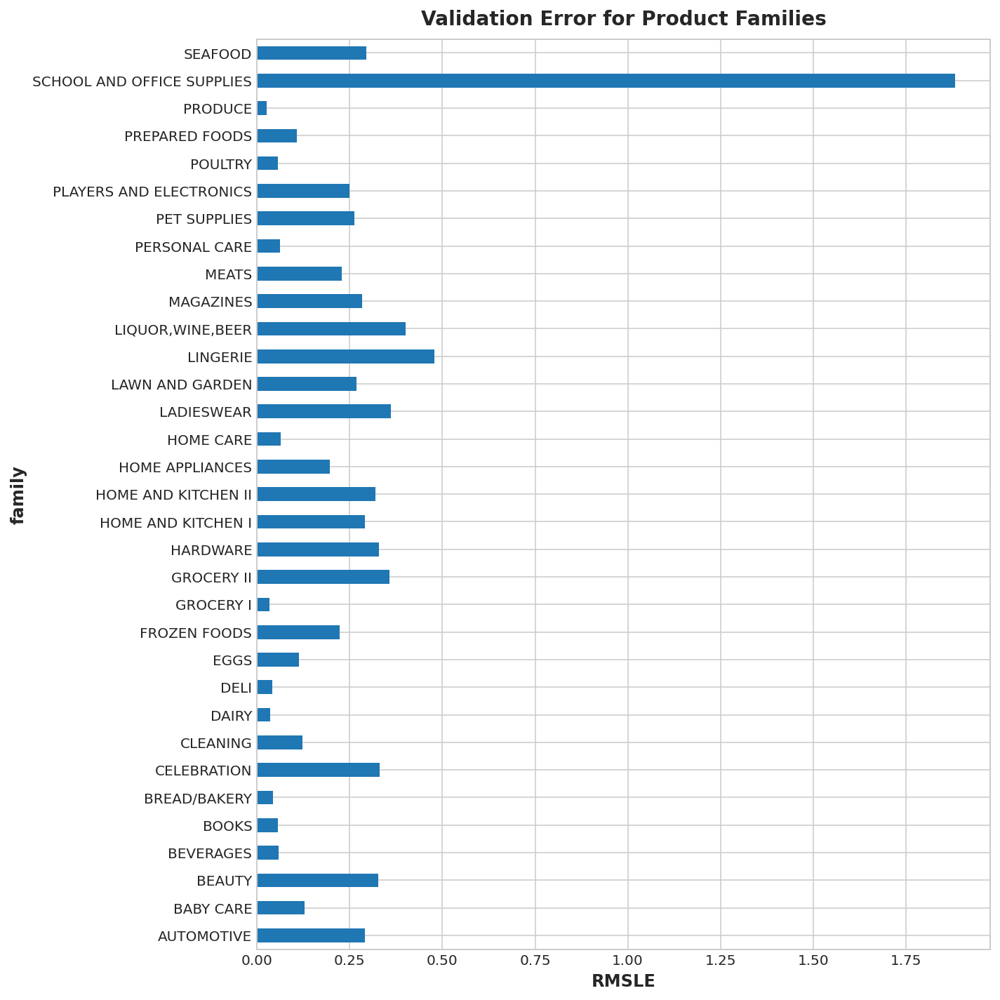

In [28]:
fig, ax = plt.subplots(figsize=(10,10))
ax = family_error.plot.barh()
ax.set_title('Validation Error for Product Families')
ax.set_xlabel('RMSLE')

Text(0.5, 0, 'RMSLE')

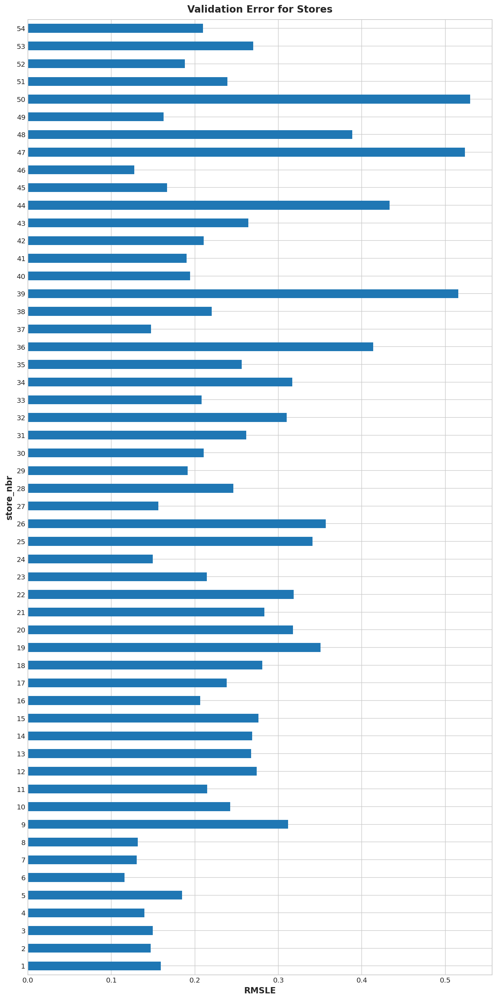

In [29]:
fig, ax = plt.subplots(figsize=(10,20))
ax = store_error.plot.barh()
ax.set_title('Validation Error for Stores')
ax.set_xlabel('RMSLE')

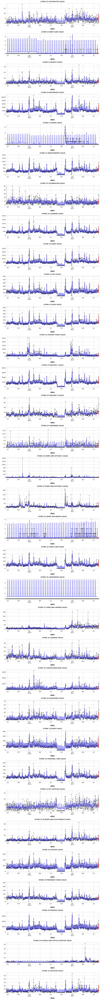

In [30]:
STORE_NUMBER = '25' # 1-54
CATEGORIES = y_train.loc(axis=1)[STORE_NUMBER].columns.to_list()

fig, axs = plt.subplots(nrows=len(CATEGORIES), ncols=1, figsize=(10, 3*len(CATEGORIES)))
for cat, ax in zip(CATEGORIES, axs.flatten()):
    y_train.loc(axis=1)[STORE_NUMBER].loc(axis=1)[cat].plot(ax=ax, **plot_params) # Training period sales data
    y_fit.loc(axis=1)[STORE_NUMBER].loc(axis=1)[cat].plot(color='blue', linewidth=4, ax=ax, alpha=0.4) # Fit of the training data
    y_val.loc(axis=1)[STORE_NUMBER].loc(axis=1)[cat].plot(ax=ax, **plot_params) # Validation period sales data
    y_pred_zero_corrected.loc(axis=1)[STORE_NUMBER].loc(axis=1)[cat].plot(color='red', linewidth=4, ax=ax, alpha=0.4) # Validation forecast
    ax.set_title(f'STORE {STORE_NUMBER} {cat} SALES', fontsize=10)


In [31]:
model1 = LinearRegression()
model2 = KNeighborsRegressor()
max_lag = 7

In [32]:
training_days = (full_train_end_day - train_start_day).days + 1
test_days = (test_end_day - test_start_day).days + 1
print(f'Training set of {training_days} days')
print(f'Test set of {test_days} days')

test_model = BoostedHybrid(model1=model1, model2=model2)

Training set of 792 days
Test set of 16 days


In [33]:
store_sales_in_date_range = store_sales_promo_leads.unstack(['store_nbr', 'family']).loc[train_start_day:full_train_end_day]
test_in_date_range = test_data_with_promo_leads.unstack(['store_nbr', 'family']).drop('id', axis=1) 
# y_test, _ = create_X1_dp_features(test_in_date_range, test=True)

X1_train, y_train, dp_test = create_X1(store_sales_in_date_range, train_start_day, full_train_end_day)
test_model.fit1(X1_train, y_train, stack_cols=['store_nbr', 'family'])

X2_train = create_X2(store_sales_in_date_range.drop('sales', axis=1).stack(['store_nbr', 'family']),
                     test_model.y_resid)
test_model.fit2(X2_train, max_lag, stack_cols=['store_nbr', 'family'])

y_fit = test_model.predict(X1_train, X2_train, max_lag).clip(0.0)

In [34]:
dp_X1_test_date_range = dp_test.out_of_sample(steps=test_days)

for step in range(test_days):
    dp_steps_so_far = dp_X1_test_date_range.loc[test_start_day:test_start_day+pd.Timedelta(days=step),:]
    
    X1_combined_dp = pd.concat([dp_test.in_sample(), dp_steps_so_far])
    X2_combined = pd.concat([store_sales_in_date_range.drop('sales', axis=1), test_in_date_range.loc[test_start_day:test_start_day+pd.Timedelta(days=step), :]])
    
    X1_test = create_X1_day_features(X1_combined_dp, train_start_day, test_start_day+pd.Timedelta(days=step), test=True)
    X2_test = create_X2(X2_combined.stack(['store_nbr', 'family']),
                      test_model.y_resid)
    
    y_forecast_combined = test_model.predict(X1_test, X2_test, max_lag).clip(0.0)
    y_plus_y_test = pd.concat([y_train, y_forecast_combined.iloc[-(step+1):]])
    
    test_model.fit1(X1_test, y_plus_y_test, stack_cols=['store_nbr', 'family'])
    test_model.fit2(X2_test, max_lag, stack_cols=['store_nbr', 'family'])
    
    print(test_start_day+pd.Timedelta(days=step))

2017-08-16 00:00:00
2017-08-17 00:00:00
2017-08-18 00:00:00
2017-08-19 00:00:00
2017-08-20 00:00:00
2017-08-21 00:00:00
2017-08-22 00:00:00
2017-08-23 00:00:00
2017-08-24 00:00:00
2017-08-25 00:00:00
2017-08-26 00:00:00
2017-08-27 00:00:00
2017-08-28 00:00:00
2017-08-29 00:00:00
2017-08-30 00:00:00
2017-08-31 00:00:00


In [35]:
y_train_last_2_weeks = y_train.iloc(axis=0)[-14:]
zero_series = y_train_last_2_weeks.columns[(y_train_last_2_weeks == 0).all()]
print(zero_series)

MultiIndex([( '1',                  'BABY CARE'),
            ( '1',                      'BOOKS'),
            ( '1',            'HOME APPLIANCES'),
            ( '1', 'SCHOOL AND OFFICE SUPPLIES'),
            ('10',                  'BABY CARE'),
            ('10',                      'BOOKS'),
            ('10',            'LAWN AND GARDEN'),
            ('11',                      'BOOKS'),
            ('12',                  'BABY CARE'),
            ('12',                      'BOOKS'),
            ...
            ('54', 'SCHOOL AND OFFICE SUPPLIES'),
            ( '6',                  'BABY CARE'),
            ( '6',                      'BOOKS'),
            ( '6',            'HOME APPLIANCES'),
            ( '6', 'SCHOOL AND OFFICE SUPPLIES'),
            ( '7',                  'BABY CARE'),
            ( '8',                      'BOOKS'),
            ( '8',            'HOME APPLIANCES'),
            ( '9',                      'BOOKS'),
            ( '9',            'HOM

In [36]:
y_forecast = pd.DataFrame(y_forecast_combined.clip(0.0), index=X1_test.index)
y_forecast_zero_corrected = y_forecast.copy()
y_forecast_zero_corrected.loc(axis=1)[zero_series] = 0
y_forecast_zero_corrected = y_forecast_zero_corrected[test_start_day:test_end_day]

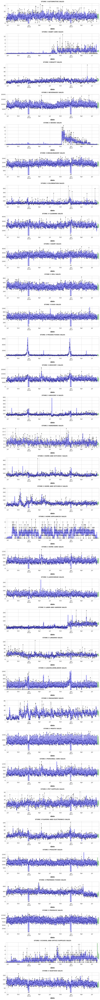

In [37]:
STORE_NUMBER = '3' # 1-54
CATEGORIES = y_train.loc(axis=1)[STORE_NUMBER].columns.to_list()

fig, axs = plt.subplots(nrows=len(CATEGORIES), ncols=1, figsize=(10, 3*len(CATEGORIES)))
for cat, ax in zip(CATEGORIES, axs.flatten()):
    y_train.loc(axis=1)[STORE_NUMBER].loc(axis=1)[cat].plot(ax=ax, **plot_params) # Training period sales data
    y_fit.loc(axis=1)[STORE_NUMBER].loc(axis=1)[cat].plot(color='blue', linewidth=4, ax=ax, alpha=0.4) # Fit of the training data
    y_forecast_zero_corrected.loc(axis=1)[STORE_NUMBER].loc(axis=1)[cat].plot(color='green', linewidth=4, ax=ax, alpha=0.4) # Test forecast
    ax.set_title(f'STORE {STORE_NUMBER} {cat} SALES', fontsize=10)

In [38]:
y_submit = y_forecast_zero_corrected.stack(['store_nbr', 'family'])
y_submit = pd.DataFrame(y_submit, columns=['sales'])
y_submit = y_submit.join(test.id).reindex(columns=['id', 'sales'])
y_submit.to_csv('submission.csv', index=False)

In [39]:
y_submit.head()

id        sales
date       store_nbr family                          
2017-08-16 1         AUTOMOTIVE  3000888     3.432071
                     BABY CARE   3000889     0.000000
                     BEAUTY      3000890     5.304472
                     BEVERAGES   3000891  2143.570728
                     BOOKS       3000892     0.000000